<a href="https://colab.research.google.com/github/krissirk0906/krissirk0906/blob/main/TrainCorner.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!git clone https://github.com/tensorflow/models.git

%cd models/research

!protoc object_detection/protos/*.proto --python_out=.

!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

Cloning into 'models'...
remote: Enumerating objects: 97003, done.
remote: Counting objects: 100% (283/283), done.
remote: Compressing objects: 100% (164/164), done.
remote: Total 97003 (delta 131), reused 251 (delta 118), pack-reused 96720
Receiving objects: 100% (97003/97003), 611.09 MiB | 37.89 MiB/s, done.
Resolving deltas: 100% (70549/70549), done.
/content/models/research
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 108.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.2 MB/s eta 0:00:00
  Preparing meta

In [3]:
!pip install tensorflow-hub
!pip uninstall tensorflow --y
!pip install tensorflow==2.15.0
!pip uninstall tensorflow-text --y
!pip install tensorflow-text==2.15.0
!pip uninstall tf-models-official --y
!pip install tf-models-official==2.15.0

Found existing installation: tensorflow 2.16.1
Uninstalling tensorflow-2.16.1:
  Successfully uninstalled tensorflow-2.16.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 79.2 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: keras
    Found existing installation: keras 3.2.1
    Uninstalling keras-3.2.1:
      Successfully uninstalled keras-3.2.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
ERROR: pip's dependency resolver does not currently take into account 

In [4]:
import shutil
import re

original_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'
with open(original_path, 'r') as file:
  content = file.read()
  content = re.sub(r'import abc', 'import tensorflow as tf\n\nimport abc', content)
  content = re.sub(r'control_flow_ops.case', 'tf.case', content)
  content = re.sub(r'control_flow_ops.cond', 'tf.compat.v1.cond', content)
with open(original_path, 'w') as file:
  file.write(content)

print(f"File {original_path} fixed.")

File /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py fixed.


In [5]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [9]:
!python model_main_tf2.py --pipeline_config_path=/content/drive/MyDrive/AI/cornersDataset/pipeline.config --model_dir=/content/drive/MyDrive/AI/cornersDataset/model_dir --alsologtostderr

2024-04-17 04:01:01.179006: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 04:01:01.179069: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 04:01:01.180972: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 04:01:02.259151: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-04-17 04:01:05.680861: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using Mir

In [9]:
%ls

anchor_generators/        export_inference_graph.py                model_lib_tf1_test.py
box_coders/               export_tflite_graph_lib_tf2.py           model_lib_tf2_test.py
builders/                 export_tflite_graph_lib_tf2_test.py      model_lib_v2.py
colab_tutorials/          export_tflite_graph_tf2.py               model_main.py
configs/                  export_tflite_ssd_graph_lib.py           model_main_tf2.py
CONTRIBUTING.md           export_tflite_ssd_graph_lib_tf1_test.py  models/
core/                     export_tflite_ssd_graph.py               model_tpu_main.py
data/                     g3doc/                                   packages/
data_decoders/            inference/                               predictors/
dataset_tools/            __init__.py                              protos/
dockerfiles/              inputs.py                                README.md
eval_util.py              inputs_test.py                           samples/
eval_util_test.py         leg

Export tflite graph

In [10]:
!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir '/content/drive/MyDrive/AI/cornersDataset/model_dir' \
    --output_directory '/content/drive/MyDrive/AI/cornersDataset/tflite_output_dir' \
    --pipeline_config_path '/content/drive/MyDrive/AI/cornersDataset/pipeline.config'

2024-04-17 07:06:27.873766: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 07:06:27.873819: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 07:06:27.875666: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 07:06:27.885017: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 07:06:28.975695: W tensorflow/compiler/tf2

Export tflite file

In [12]:
import tensorflow as tf
_TFLITE_MODEL_PATH = "/content/drive/MyDrive/AI/cornersDataset/tflite_output_dir/corner_detection.tflite"

converter = tf.lite.TFLiteConverter.from_saved_model('/content/drive/MyDrive/AI/cornersDataset/tflite_output_dir/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
  tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
]
tflite_model = converter.convert()

with open(_TFLITE_MODEL_PATH, 'wb') as f:
  f.write(tflite_model)

In [12]:
# import tensorflow as tf
# Load the .pb file
# converter = tf.lite.TFLiteConverter.from_saved_model("/content/drive/MyDrive/AI/cornersDataset/output/saved_model")
# converter.target_spec.supported_ops = [
#   tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
#   tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
# ]

# # Convert the model
# tflite_model = converter.convert()
# # Save the .tflite file
# with open("/content/drive/MyDrive/AI/cornersDataset/output/saved_model/corner_detect_orginal_1.tflite", "wb") as f:
#    f.write(tflite_model)

In [17]:
# Load TFLite model and see some details about input/output
import tensorflow as tf
tflite_interpreter = tf.lite.Interpreter(model_path=_TFLITE_MODEL_PATH)

input_details = tflite_interpreter.get_input_details()
output_details = tflite_interpreter.get_output_details()

print("== Input details ==")
print("name:", input_details[0]['name'])
print("shape:", input_details[0]['shape'])
print("type:", input_details[0]['dtype'])

print("\n== Output details ==")
print("name:", output_details[0]['name'])
print("shape:", output_details[0]['shape'])
print("type:", output_details[0]['dtype'])

== Input details ==
name: serving_default_input:0
shape: [  1 300 300   3]
type: <class 'numpy.float32'>

== Output details ==
name: StatefulPartitionedCall:1
shape: []
type: <class 'numpy.float32'>


In [19]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/AI/cornersDataset/pipeline.config --trained_checkpoint_dir /content/drive/MyDrive/AI/cornersDataset/model_dir --output_directory /content/drive/MyDrive/AI/cornersDataset/output

2024-04-17 03:41:08.681629: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 03:41:08.681675: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 03:41:08.683209: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 03:41:09.749606: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-04-17 03:41:13.269203: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating

Image interfer

height 300
width 300
boxes  [[1.2031268e-02 9.6534532e-01 6.1270524e-02 9.9389404e-01]
 [5.5964701e-03 5.7552140e-03 5.5989463e-02 3.7960596e-02]
 [9.3868852e-01 1.5800798e-02 9.8384655e-01 4.6166472e-02]
 [9.4235939e-01 9.4587338e-01 9.8956805e-01 9.7697389e-01]
 [9.4545949e-01 9.3165445e-01 9.9076426e-01 9.6819806e-01]
 [9.2310739e-01 1.1561241e-02 9.7929204e-01 4.9405593e-02]
 [1.4870878e-02 9.6333534e-01 9.0104371e-02 9.9580485e-01]
 [9.1282505e-01 9.4861877e-01 9.7481900e-01 9.8622453e-01]
 [9.4135928e-01 3.5569515e-02 9.8511744e-01 7.4380666e-02]
 [1.9350991e-02 5.1141344e-04 9.8786958e-02 3.8712092e-02]]
classes  [1. 0. 2. 3. 3. 2. 1. 3. 2. 0.]
scores  [0.867764   0.86061203 0.8333086  0.80598164 0.40984955 0.18663509
 0.15122774 0.14686367 0.12583002 0.10422917]


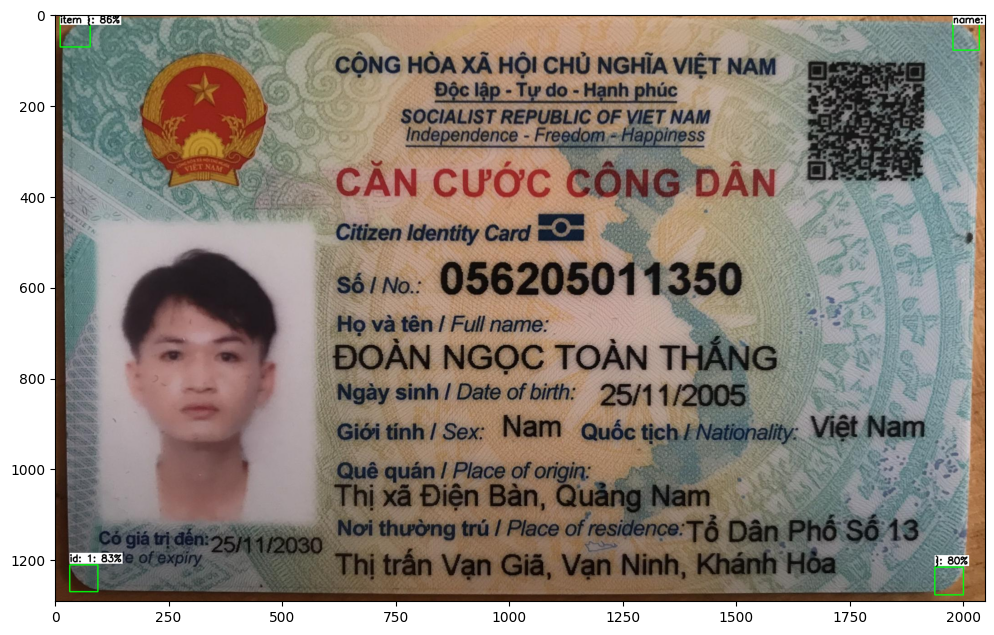

boxes  [[ 9.6993521e-05  9.5164979e-01  4.2579070e-02  9.8758924e-01]
 [ 3.3139892e-02  1.1234473e-02  8.1851423e-02  4.6430331e-02]
 [ 9.5573771e-01 -4.7798641e-04  9.9712729e-01  3.0742081e-02]
 [ 9.6087623e-01  9.6297354e-01  1.0020196e+00  9.9667567e-01]
 [ 2.5362689e-02  3.3588689e-03  7.7998012e-02  3.6919676e-02]
 [-5.4841302e-04  9.4142276e-01  4.4354104e-02  9.7443169e-01]
 [ 9.6387058e-01  9.1507423e-01  1.0026898e+00  9.5615292e-01]
 [ 3.9113544e-02  3.6637984e-02  8.3320729e-02  8.2412720e-02]
 [ 9.0187758e-01 -3.7484225e-03  9.6873432e-01  4.4123568e-02]
 [ 7.9421420e-03  3.9238669e-02  5.9038967e-02  9.3809746e-02]]
classes  [1. 0. 2. 3. 0. 1. 3. 0. 2. 0.]
scores  [0.8152802  0.7988179  0.77266145 0.7290181  0.36663434 0.17334828
 0.14428088 0.07928763 0.07211941 0.06088055]


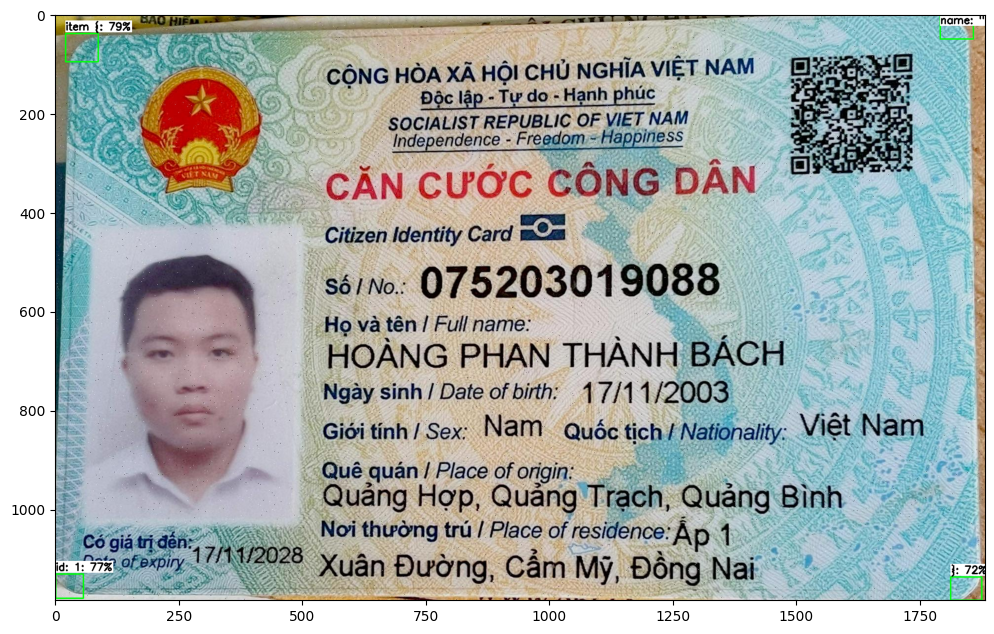

boxes  [[0.9382509  0.95863265 0.98361766 0.98742706]
 [0.9424515  0.01374052 0.98624575 0.04126485]
 [0.00992272 0.9662005  0.05825092 0.99465334]
 [0.02318115 0.00735321 0.07153671 0.03759908]
 [0.9121659  0.9607148  0.97284615 0.99493515]
 [0.01628364 0.96679085 0.08596525 1.0007854 ]
 [0.9413758  0.92578816 0.992829   0.97031546]
 [0.9165757  0.00933866 0.9789095  0.0483337 ]
 [0.94555265 0.03696797 0.9865648  0.07172221]
 [0.01104594 0.03868875 0.05781096 0.09144236]]
classes  [3. 2. 1. 0. 3. 1. 3. 2. 2. 0.]
scores  [0.8419355  0.8419295  0.8323926  0.7339275  0.21490021 0.20234163
 0.18159668 0.15665124 0.14649132 0.06652469]


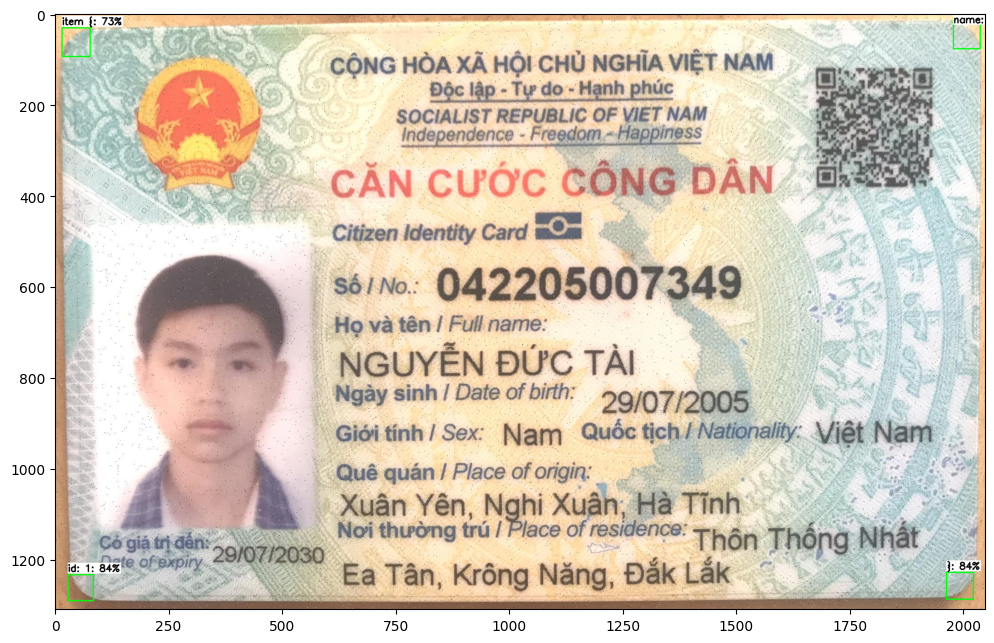

boxes  [[0.94878036 0.00554361 0.99093    0.04092824]
 [0.02066099 0.00509717 0.07059707 0.03791052]
 [0.03066008 0.9626195  0.08803799 0.9943107 ]
 [0.9345188  0.9493812  0.9856868  0.98945624]
 [0.01954529 0.0024871  0.08980124 0.04252231]
 [0.9104942  0.9533174  0.97229934 0.99209046]
 [0.94526434 0.9229454  0.99360955 0.9690733 ]
 [0.00616156 0.03564063 0.05433557 0.09091545]
 [0.9067515  0.00503496 0.9708322  0.05136733]
 [0.9513602  0.03703495 0.9917444  0.08875   ]]
classes  [2. 0. 1. 3. 0. 3. 3. 0. 2. 2.]
scores  [0.8085279  0.80010355 0.7998282  0.7329118  0.5416992  0.26498854
 0.23340806 0.09350408 0.09004987 0.08761618]


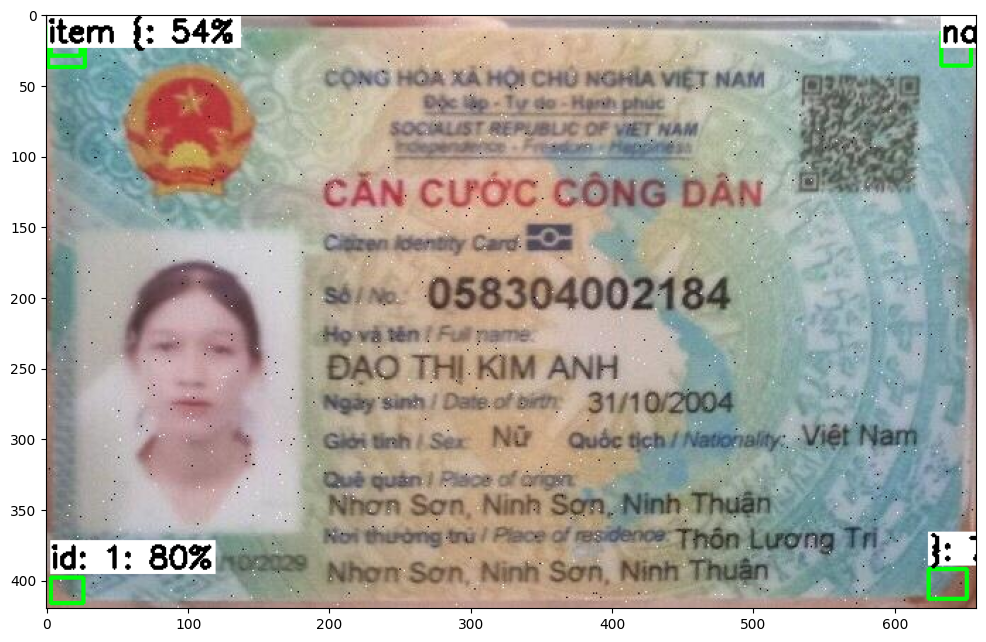

boxes  [[0.01740376 0.9611037  0.06245764 0.99419856]
 [0.94588286 0.00502104 0.9956766  0.03442758]
 [0.9442187  0.9645594  0.98844486 0.9943624 ]
 [0.0131628  0.00465273 0.05583932 0.03156442]
 [0.0194902  0.9598351  0.08768876 0.9957023 ]
 [0.95614433 0.9212592  0.99761677 0.9622511 ]
 [0.00941568 0.9304067  0.05609518 0.9743346 ]
 [0.01920773 0.00535715 0.0787214  0.0386157 ]
 [0.4688544  0.6745809  0.5227634  0.73389286]
 [0.90233105 0.00100795 0.9711277  0.04878607]]
classes  [1. 2. 3. 0. 1. 3. 1. 0. 0. 2.]
scores  [0.85519254 0.8322513  0.7989714  0.6694886  0.1553131  0.15140162
 0.08302074 0.07627777 0.07602546 0.07509552]


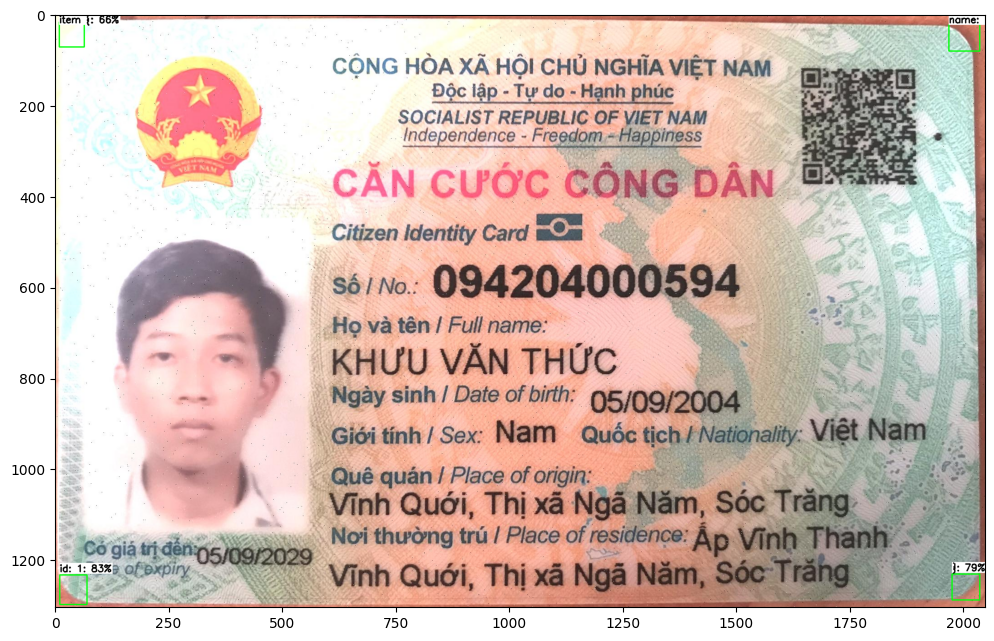

boxes  [[ 3.6685150e-03  1.1018014e-02  4.7228120e-02  4.3770641e-02]
 [ 9.4456768e-01  9.7592229e-01  9.8504829e-01  9.9810177e-01]
 [ 9.5735973e-01  2.5244346e-03  9.9285120e-01  2.5577508e-02]
 [ 1.0614160e-02  9.6187156e-01  5.1012594e-02  9.8811430e-01]
 [ 9.0682310e-01  9.6313566e-01  9.7819489e-01  9.9752241e-01]
 [ 9.4948447e-01  9.0734643e-01  9.9710536e-01  9.5571762e-01]
 [ 2.6934937e-02  9.6297359e-01  8.7703034e-02  9.9440849e-01]
 [ 9.0775603e-01 -5.8965757e-05  9.6948844e-01  3.4354210e-02]
 [ 1.5449215e-02 -1.4266502e-03  1.0515009e-01  4.3212146e-02]
 [ 9.5513344e-01  8.5325944e-01  9.9697268e-01  8.9412212e-01]]
classes  [0. 3. 2. 1. 3. 3. 1. 2. 0. 3.]
scores  [0.84383816 0.8136159  0.8043468  0.80370396 0.12969397 0.10515822
 0.10000364 0.09779284 0.08743814 0.07488856]


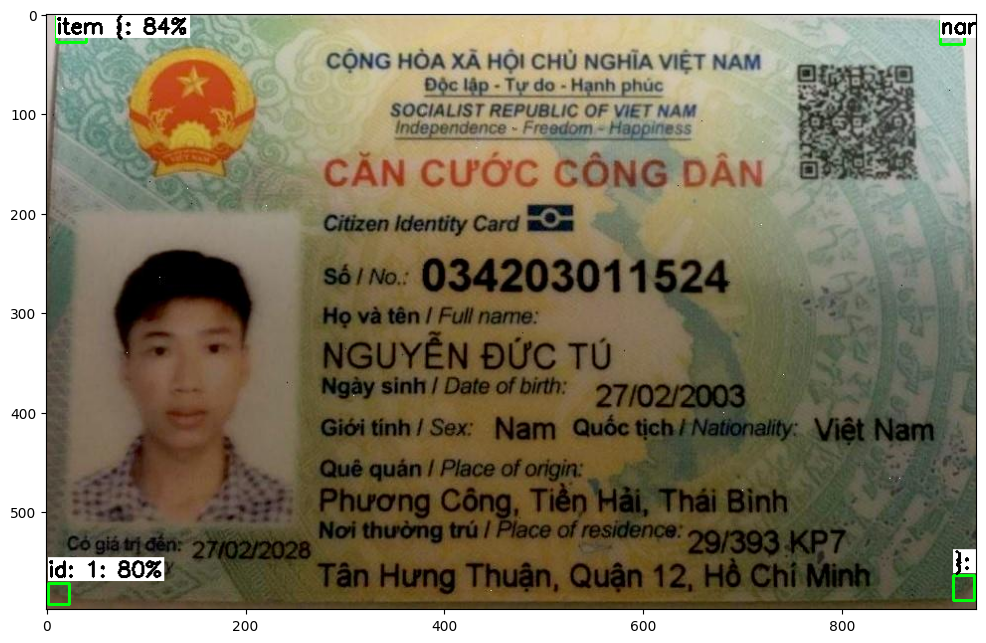

boxes  [[ 6.8091229e-04  9.5183623e-01  4.5906011e-02  9.8670888e-01]
 [ 3.1456687e-02  8.9769810e-03  8.5968547e-02  4.9243063e-02]
 [ 9.5602387e-01  5.1312335e-04  9.9766904e-01  3.2338165e-02]
 [ 9.6067208e-01  9.6405298e-01  1.0018156e+00  9.9720234e-01]
 [ 9.6573722e-01  9.1449922e-01  1.0031086e+00  9.5436162e-01]
 [-2.8978288e-04  9.4151735e-01  4.4178452e-02  9.7481084e-01]
 [ 3.8419999e-02  3.2979257e-02  8.8454492e-02  8.3918534e-02]
 [ 8.6914164e-01  2.4094260e-01  9.0539080e-01  2.7111769e-01]
 [ 9.0461874e-01 -2.9734317e-03  9.6959686e-01  4.5700565e-02]
 [ 4.8033163e-02  2.5049502e-01  9.9683866e-02  3.2267064e-01]]
classes  [1. 0. 2. 3. 3. 1. 0. 2. 2. 0.]
scores  [0.8416114  0.81601804 0.77473664 0.7449608  0.1642796  0.15717454
 0.08772872 0.07395661 0.07122416 0.07040731]


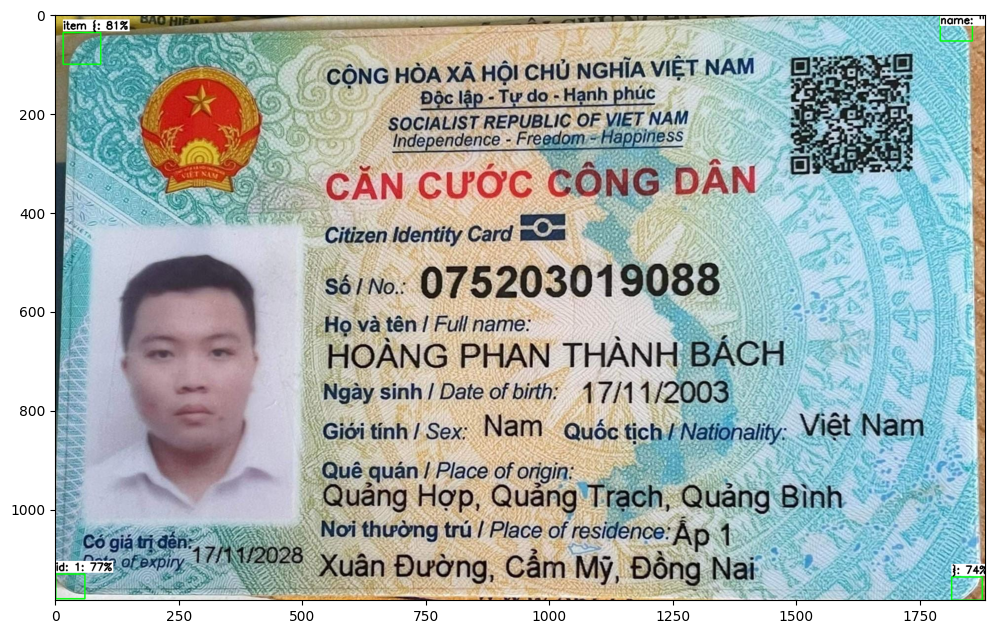

boxes  [[ 1.1461116e-03 -2.0988975e-03  4.9017742e-02  2.8394006e-02]
 [ 9.6322775e-01  9.6993119e-01  1.0010078e+00  9.9739641e-01]
 [ 9.6432269e-01 -1.1947751e-03  9.9869299e-01  2.3358777e-02]
 [ 6.3420776e-03  9.7139591e-01  5.1385187e-02  9.9913973e-01]
 [ 4.7250837e-02  9.6397334e-01  7.9343915e-02  9.9226135e-01]
 [ 9.0301192e-01  9.5081741e-01  9.6482944e-01  9.9200755e-01]
 [ 1.8344689e-02 -2.9302761e-04  8.6678073e-02  3.3649154e-02]
 [ 9.5872432e-01  8.9887005e-01  1.0054302e+00  9.5205015e-01]
 [ 4.5535106e-02  7.9164016e-01  7.8260347e-02  8.2594955e-01]
 [ 9.0263700e-01 -5.2662399e-03  9.6437728e-01  3.3920899e-02]]
classes  [0. 3. 2. 1. 1. 3. 0. 3. 1. 2.]
scores  [0.8195362  0.6870012  0.68057287 0.60266876 0.20336142 0.13698336
 0.11296682 0.09924542 0.08547367 0.07480365]


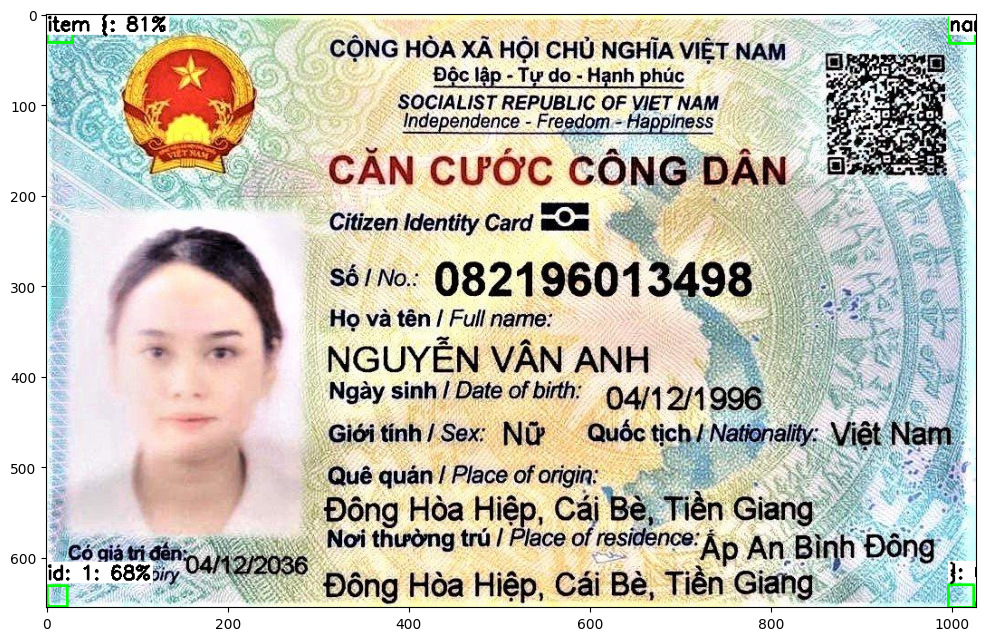

boxes  [[ 0.01828599  0.9617723   0.06470664  0.99230766]
 [ 0.94131213  0.9454275   0.98643607  0.97590524]
 [ 0.00318031  0.00130512  0.05278828  0.03459955]
 [ 0.9329017   0.01221367  0.97782654  0.0394922 ]
 [ 0.92356193  0.9462107   0.97905433  0.98141116]
 [ 0.0247408   0.96104777  0.08679873  0.99482656]
 [ 0.92274904  0.92711055  0.9744365   0.9635339 ]
 [ 0.79594934  0.15238614  0.85176337  0.20563905]
 [ 0.00886524  0.9350825   0.05678146  0.97545224]
 [-0.00502877  0.03695288  0.04703294  0.09879613]]
classes  [1. 3. 0. 2. 3. 1. 3. 2. 1. 0.]
scores  [0.85137445 0.7965331  0.7581753  0.7144098  0.24468687 0.15350837
 0.08971371 0.07247739 0.06512368 0.05552324]


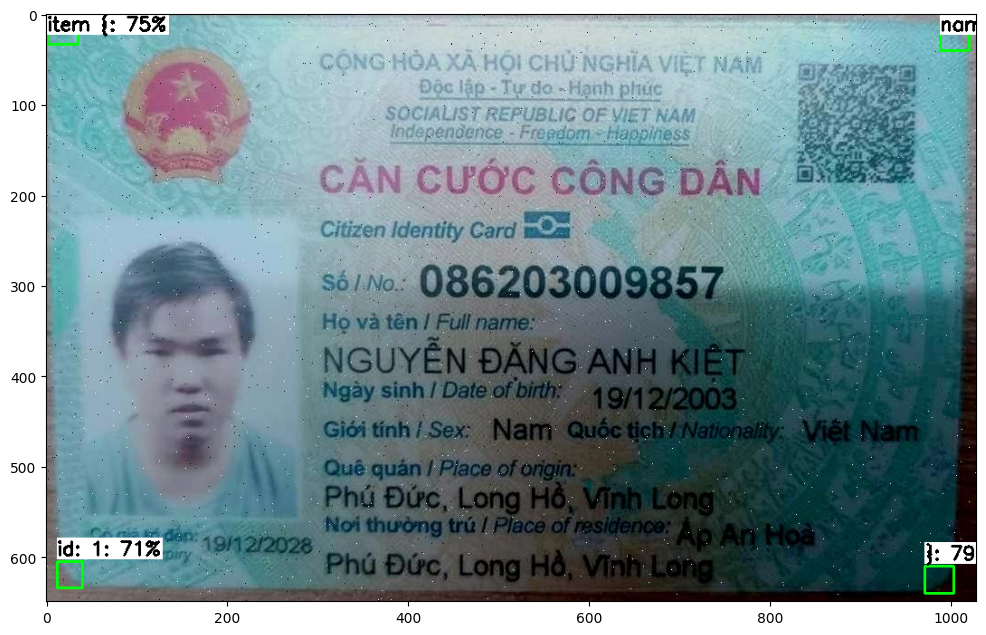

boxes  [[0.00762247 0.0042406  0.05637262 0.03489218]
 [0.01339609 0.9658237  0.0590063  0.9932392 ]
 [0.9406244  0.95003474 0.98633486 0.98166525]
 [0.93767494 0.01793184 0.98321325 0.04670074]
 [0.94200075 0.92960685 0.9877063  0.96685547]
 [0.9177431  0.01154905 0.97719467 0.04849127]
 [0.91101354 0.9497447  0.96990687 0.98767316]
 [0.01576778 0.96236944 0.09025679 0.9944422 ]
 [0.91635823 0.90525466 0.97167253 0.94655424]
 [0.0080035  0.25595763 0.05598758 0.31033936]]
classes  [0. 1. 3. 2. 3. 2. 3. 1. 3. 0.]
scores  [0.86465484 0.85142756 0.8440186  0.8009133  0.3548446  0.21179946
 0.1457354  0.1451951  0.1039905  0.08669977]


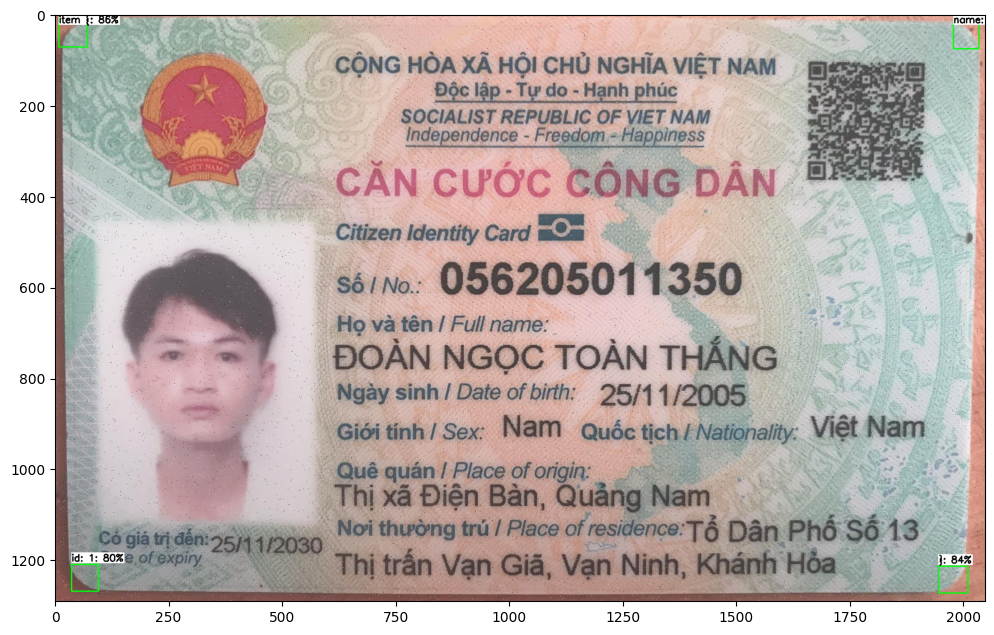

In [21]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]
  print("height",height)
  print("width",width)

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects
      print("boxes ", boxes)
      print("classes " , classes)
      print("scores " ,scores)
      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

  # Set up variables for running user's model
PATH_TO_IMAGES='/content/drive/MyDrive/AI/cornersDataset/test_data'   # Path to test images folder
PATH_TO_MODEL='/content/drive/MyDrive/AI/cornersDataset/tflite_output_dir/corner_detection.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/drive/MyDrive/AI/cornersDataset/label_map.pbtxt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)